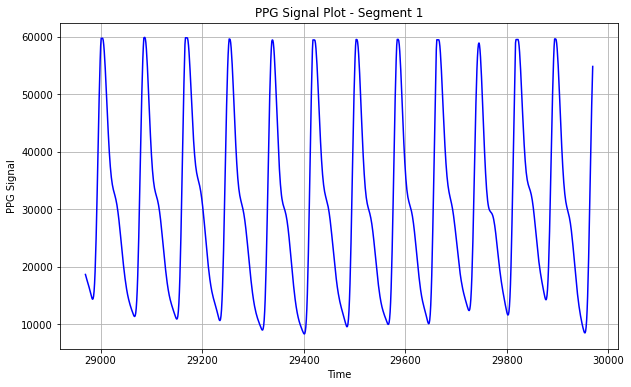

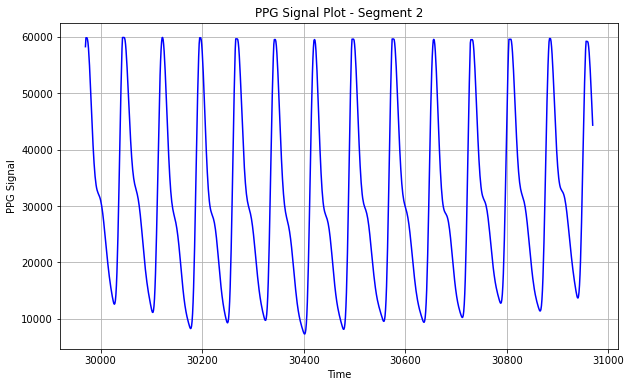

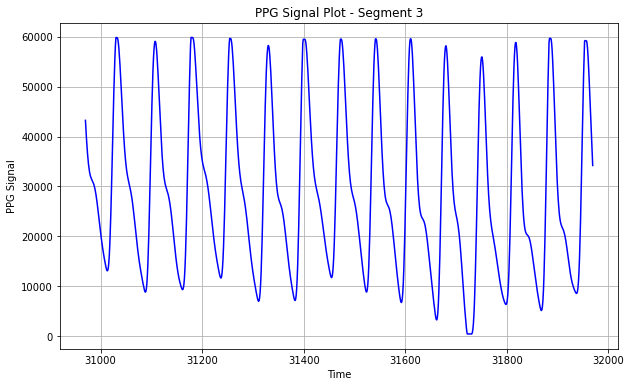

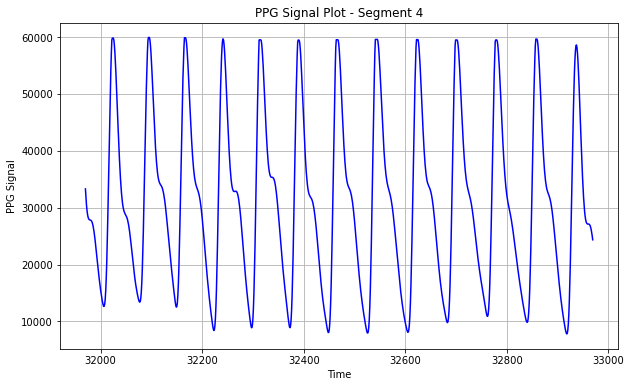

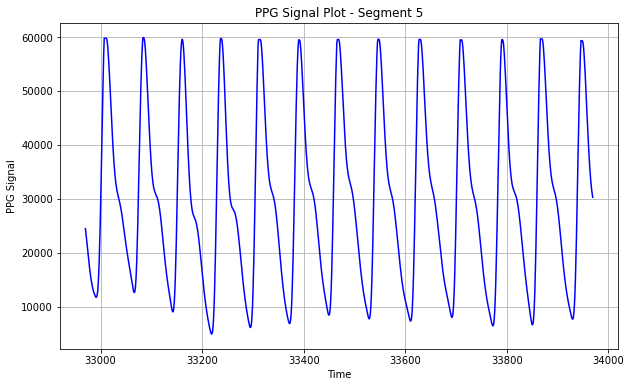

...

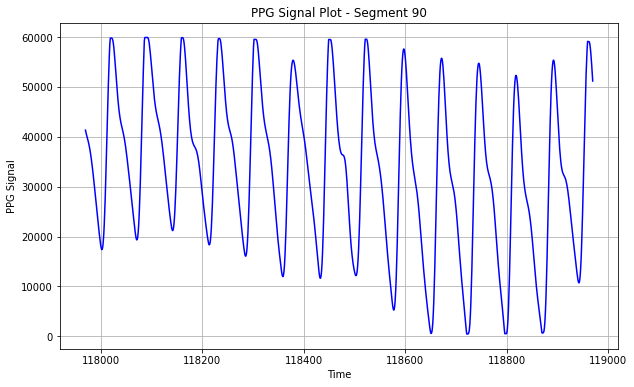

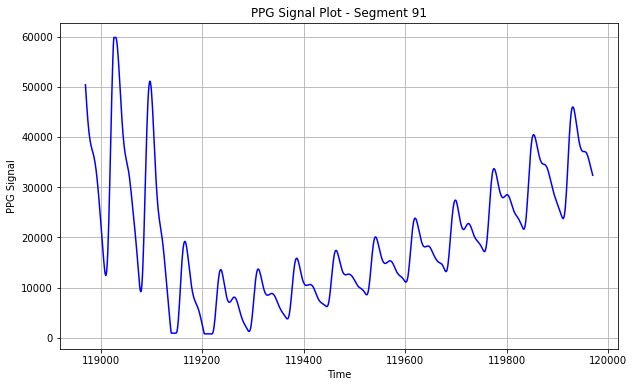

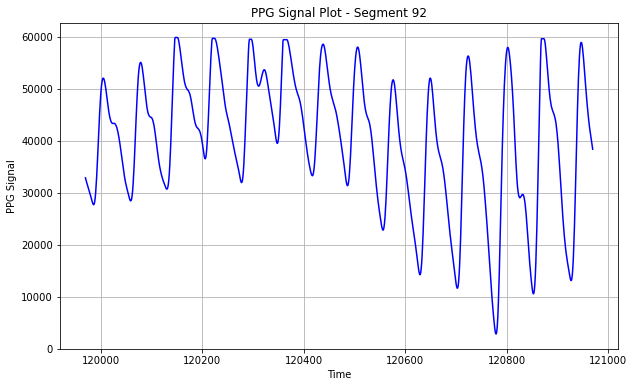

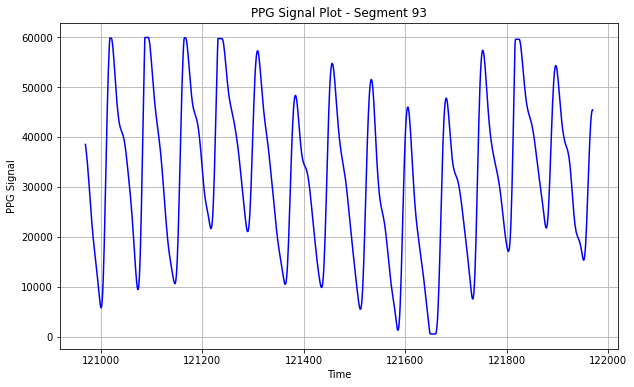

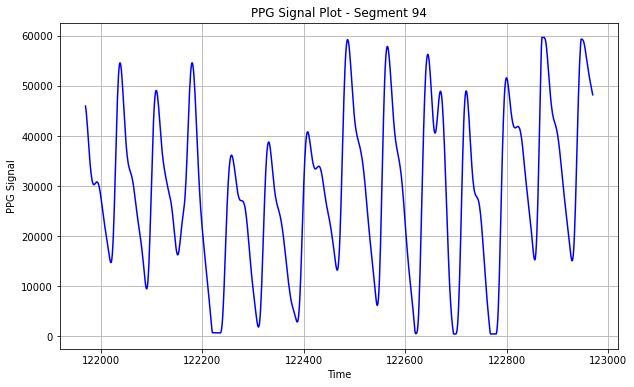

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Read the CSV file containing the PPG signal data
csv_file = "asad_70_500_with_shifted_signal.csv"
df = pd.read_csv(csv_file)

# Assuming each segment has 1000 data points
segment_size = 1000
num_segments = len(df) // segment_size

# Plot each segment of data
for i in range(num_segments):
    start_index = i * segment_size
    end_index = min((i + 1) * segment_size, len(df))
    
    time = df['index'][start_index:end_index] 
    ppg_signal = df['ShiftedSignal'][start_index:end_index]
    
    plt.figure(figsize=(10, 6))
    plt.plot(time, ppg_signal, color='b', linestyle='-')
    plt.xlabel('Time')
    plt.ylabel('PPG Signal')
    plt.title(f'PPG Signal Plot - Segment {i+1}')
    plt.grid(True)
    plt.show()


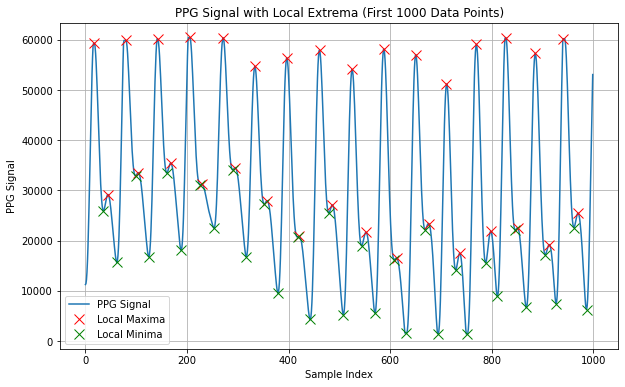

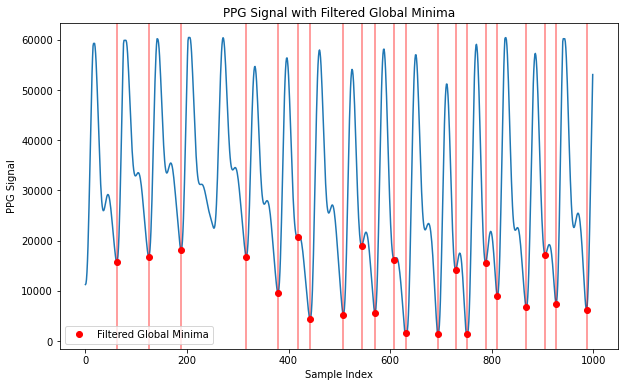

Time of cycle end 1: 620 ms
Time of cycle end 2: 1250 ms
Time of cycle end 3: 1880 ms
Time of cycle end 4: 3170 ms
Time of cycle end 5: 3790 ms
Time of cycle end 6: 4180 ms
Time of cycle end 7: 4430 ms
Time of cycle end 8: 5080 ms
Time of cycle end 9: 5440 ms
Time of cycle end 10: 5700 ms
Time of cycle end 11: 6080 ms
Time of cycle end 12: 6320 ms
Time of cycle end 13: 6940 ms
Time of cycle end 14: 7290 ms
Time of cycle end 15: 7520 ms
Time of cycle end 16: 7880 ms
Time of cycle end 17: 8110 ms
Time of cycle end 18: 8680 ms
Time of cycle end 19: 9060 ms
Time of cycle end 20: 9270 ms
Time of cycle end 21: 9870 ms
 630
 630
 1290
 620
 390
 250
 650
 360
 260
 380
 240
 620
 350
 230
 360
 230
 570
 380
 210
 600


In [30]:

# Replace 'path/to/your/data.csv' with your actual file path
csv_path = 'tushar_70_500_with_shifted_signal.csv'
time_stamps = df['Time'].to_numpy()
# Read CSV data and select signal column (adjust if necessary)
data = pd.read_csv(csv_path)['ShiftedSignal'].to_numpy()

# Ensure data is 1-dimensional
data = data.flatten()
# Take only the first 1000 data points
data = data[17000:18000]

# Peak detection for local maxima
peaks_max, _ = find_peaks(data, prominence=10)

# Peak detection for local minima
peaks_min, _ = find_peaks(-data, prominence=10)

# Plot PPG signal with peaks
plt.figure(figsize=(10, 6))
plt.plot(data, label='PPG Signal')
plt.plot(peaks_max, data[peaks_max], "x", markersize=10, label='Local Maxima', color='red')
plt.plot(peaks_min, data[peaks_min], "x", markersize=10, label='Local Minima', color='green')
plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Local Extrema (First 1000 Data Points)')
plt.legend()
plt.grid(True)
plt.show()
# Find global minima of the negated PPG signal
minima, _ = find_peaks(-data, prominence=10)

# Filter minima based on condition (minimum value > 22000)
filtered_minima = [min_index for min_index in minima if data[min_index] < 21000]

# Plot PPG signal
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.plot(data,)
plt.title('PPG Signal with Filtered Global Minima')
plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')

plt.plot(filtered_minima, data[filtered_minima], 'ro', markersize=6, label='Filtered Global Minima')

# Draw full vertical lines at filtered global minima positions
for min_index in filtered_minima:
    plt.axvline(x=min_index, color='red', linestyle='-', alpha=0.5)

plt.legend()
plt.show()

# Extract time stamps corresponding to filtered global minima
time_of_minima = time_stamps[filtered_minima]

# Print time stamps
for idx, time in enumerate(time_of_minima):
    print(f"Time of cycle end {idx+1}: {time} ms")

# Extract time stamps corresponding to filtered global minima
time_of_minima = time_stamps[filtered_minima]

# Calculate cycle times
cycle_times = []
for i in range(1, len(time_of_minima)):
    cycle_time = time_of_minima[i] - time_of_minima[i-1]
    cycle_times.append(cycle_time)

# Print cycle times
for idx, time in enumerate(cycle_times):
    print(f" {time}")

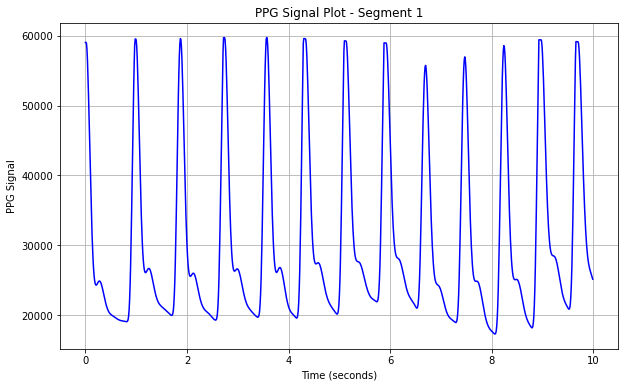

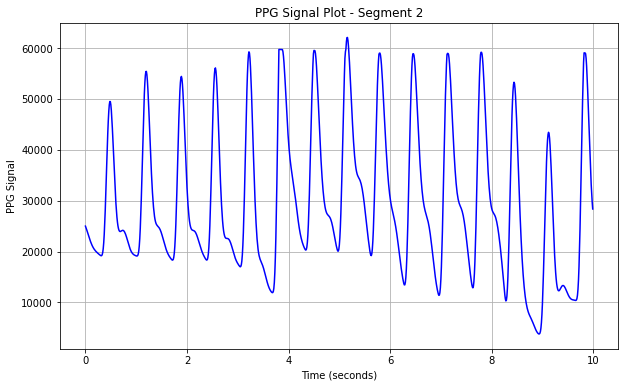

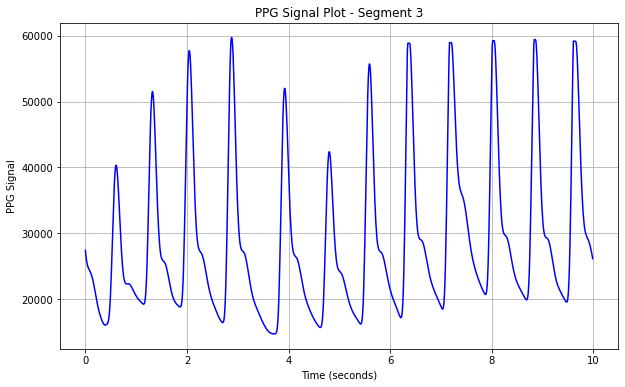

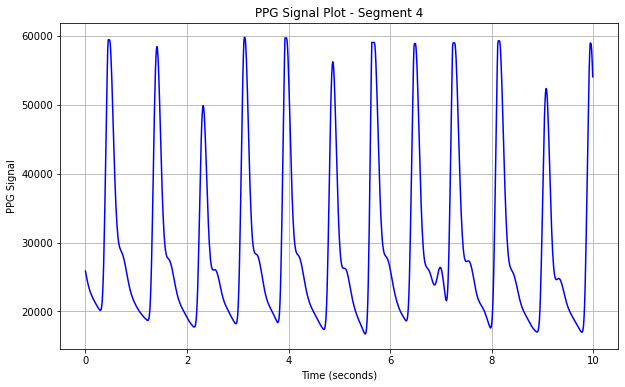

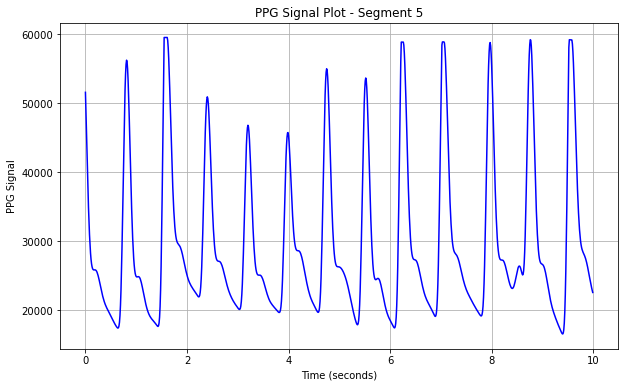

...

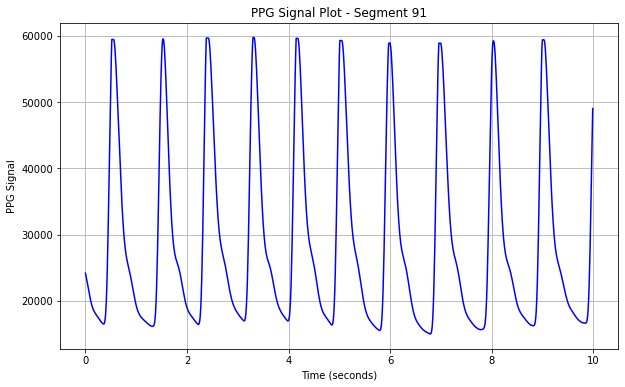

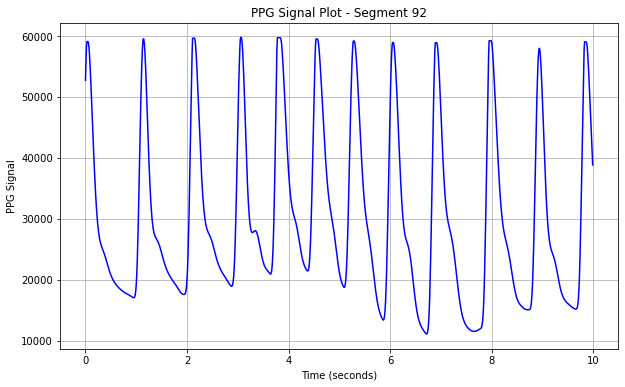

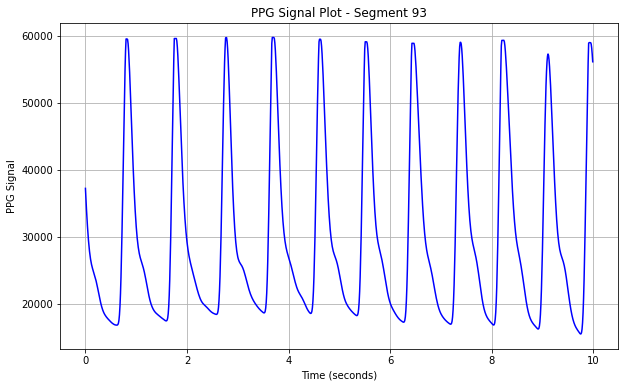

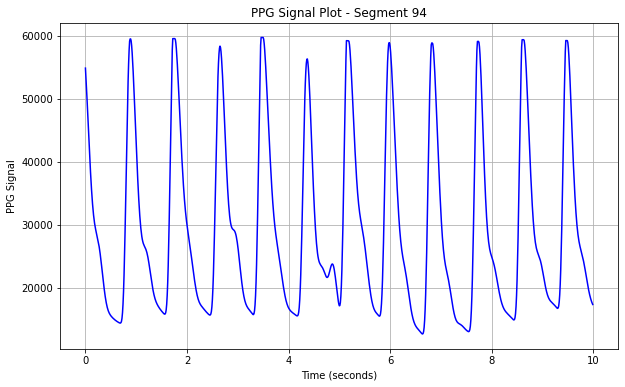

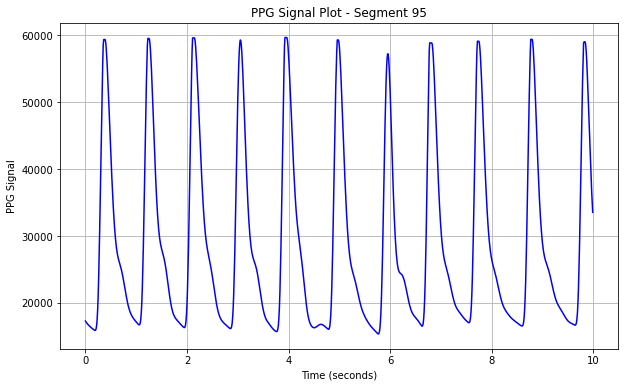

In [32]:
segment_size = 1000
num_segments = len(df) // segment_size

# Define the time scale factor
time_scale_factor = 0.01  # 100 indices represent 1 second

# Plot each segment of data
for i in range(num_segments):
    start_index = i * segment_size
    end_index = min((i + 1) * segment_size, len(df))
    
    time = (df['index'][start_index:end_index] - df['index'][start_index]) * time_scale_factor
    ppg_signal = (df['ShiftedSignal'][start_index:end_index] )
    
    plt.figure(figsize=(10, 6))
    plt.plot(time, ppg_signal, color='b', linestyle='-')
    plt.xlabel('Time (seconds)')
    plt.ylabel('PPG Signal')
    plt.title(f'PPG Signal Plot - Segment {i+1}')
    plt.grid(True)
    plt.show()

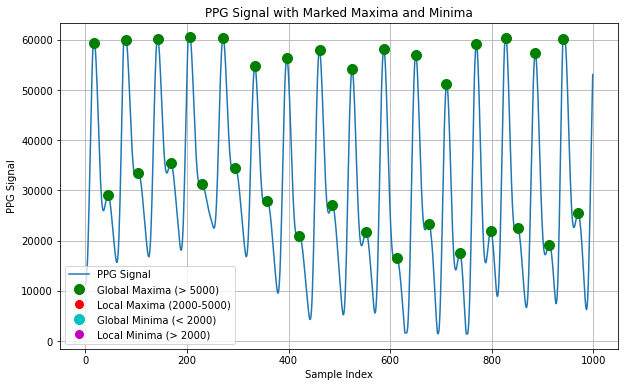

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the PPG signal from the CSV file
# csv_file_path = 'tasmir_70_500_with_shifted_signal.csv'
# Replace 'ppg_signal.csv' with your file path
df = pd.read_csv(csv_file)
ppg_signal = df['ShiftedSignal'].values[17000:18000]

# Find global maxima greater than 5000

# Find global maxima greater than 5000
# Find global maxima greater than 5000
global_maxima, _ = find_peaks(ppg_signal, height=5000)

# Find local maxima less than 5000 and greater than 2000
local_maxima, _ = find_peaks(ppg_signal, height=(2000, 5000))

# Find global minima less than 2000
global_minima, _ = find_peaks(-ppg_signal, height=2000)

# Find local minima greater than 2000
local_minima, _ = find_peaks(-ppg_signal, height=2000)
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]
# Plot the PPG signal with marked maxima and minima
plt.figure(figsize=(10, 6))
plt.plot(ppg_signal, label='PPG Signal')

# Mark global maxima with green dots
plt.plot(global_maxima, ppg_signal[global_maxima], 'go', markersize=10, label='Global Maxima (> 5000)')

# Mark local maxima with red dots
plt.plot(local_maxima, ppg_signal[local_maxima], 'ro', markersize=8, label='Local Maxima (2000-5000)')

# Mark global minima with cyan dots
plt.plot(global_minima, ppg_signal[global_minima], 'co', markersize=10, label='Global Minima (< 2000)')

# Mark local minima with magenta dots
plt.plot(local_minima, ppg_signal[local_minima], 'mo', markersize=8, label='Local Minima (> 2000)')

plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Marked Maxima and Minima')
plt.legend()
plt.grid(True)
plt.show()

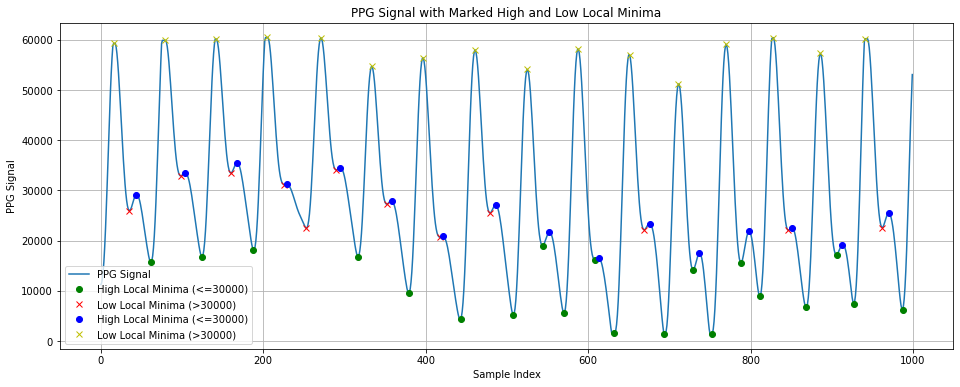

In [33]:
time_stamps = df['Time'].to_numpy()
# time_stamps = np.arange(23000,24000)
# Peak detection for local minima in the PPG signal
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 20000]
low_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value > 20000]

# # Print high local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("High Local Minima (<=30000):")
# for peak in high_minima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# # Print low local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("\nLow Local Minima (>30000):")
# for peak in low_minima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")
    
high_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value <= 50000]
low_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value > 50000]

# # Print high local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("High Local maximaa (<=50000):")
# for peak in high_maxima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# # Print low local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("\nLow Local maxima (>30000):")
# for peak in low_maxima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# Plot the PPG signal with marked high and low local minima

# Plot the PPG signal with marked high and low local minima
plt.figure(figsize=(16, 6))  # Adjust figure size as needed
plt.plot(ppg_signal, label='PPG Signal')

# Mark high local minima with green circles
plt.plot(high_minima_indices, ppg_signal[high_minima_indices], 'go', markersize=6, label='High Local Minima (<=30000)')

# Mark low local minima with red crosses
plt.plot(low_minima_indices, ppg_signal[low_minima_indices], 'rx', markersize=6, label='Low Local Minima (>30000)')

# plt.xlabel('Sample Index')
# plt.ylabel('PPG Signal')
# plt.title('PPG Signal with Marked High and Low Local Minima')
# plt.legend()
# plt.grid(True)
# plt.show()

# Peak detection for local minima in the PPG signal
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude

# plt.figure(figsize=(12, 6))  # Adjust figure size as needed
# plt.plot(ppg_signal, label='PPG Signal')

# Mark high local minima with green circles
plt.plot(high_maxima_indices, ppg_signal[high_maxima_indices], 'bo', markersize=6, label='High Local Minima (<=30000)')

# Mark low local minima with red crosses
plt.plot(low_maxima_indices, ppg_signal[low_maxima_indices], 'yx', markersize=6, label='Low Local Minima (>30000)')

plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Marked High and Low Local Minima')
plt.legend()
plt.grid(True)
plt.show()

In [6]:
import plotly.graph_objects as go
# Create figure
fig = go.Figure()

# Add PPG signal trace
fig.add_trace(go.Scatter(
    x=time_stamps,
    y=ppg_signal,
    mode='lines',
    name='PPG Signal'
))

# Add high local minima trace
fig.add_trace(go.Scatter(
    x=time_stamps[high_minima_indices],
    y=ppg_signal[high_minima_indices],
    mode='markers',
    marker=dict(color='green', size=10, symbol='circle'),
    name='High Local Minima (<=20000)'
))

# Add low local minima trace
fig.add_trace(go.Scatter(
    x=time_stamps[low_minima_indices],
    y=ppg_signal[low_minima_indices],
    mode='markers',
    marker=dict(color='red', size=10, symbol='x'),
    name='Low Local Minima (>20000)'
))

# Add high local maxima trace
fig.add_trace(go.Scatter(
    x=time_stamps[high_maxima_indices],
    y=ppg_signal[high_maxima_indices],
    mode='markers',
    marker=dict(color='blue', size=10, symbol='circle'),
    name='High Local Maxima (<=50000)'
))

# Add low local maxima trace
fig.add_trace(go.Scatter(
    x=time_stamps[low_maxima_indices],
    y=ppg_signal[low_maxima_indices],
    mode='markers',
    marker=dict(color='yellow', size=10, symbol='x'),
    name='Low Local Maxima (>50000)'
))

# Update layout
fig.update_layout(
    title='PPG Signal with Marked High and Low Local Extrema',
    xaxis_title='Time (ms)',
    yaxis_title='PPG Signal',
    showlegend=True,
    legend=dict(
        x=0,
        y=1,
        bgcolor='rgba(255, 255, 255, 0.5)',
        bordercolor='rgba(0, 0, 0, 0.5)',
        borderwidth=1
    ),
    plot_bgcolor='rgba(0, 0, 0, 0)'
)

# Show plot
fig.show()


In [34]:
# Peak detection for local minima in the PPG signal
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]

# Classify minima as high or low based on amplitude
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 20000]
low_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value > 20000]

# Calculate time difference between high local minima to the next low local minima
high_to_low_time_diff = []
for high_index in high_minima_indices:
    next_low_index = min([low_index for low_index in low_minima_indices if low_index > high_index], default=None)
    if next_low_index is not None:
        time_diff = time_stamps[next_low_index] - time_stamps[high_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Local Minima to Next Low Local Minima:")
print(high_to_low_time_diff)

# Peak detection for local minima in the PPG signal
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude
high_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value > 50000]
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 50000]

# Calculate time difference between high local minima to the next low local minima
high_to_low_time_diff = []
for high_index in high_maxima_indices:
    next_low_index = min([low_index for low_index in low_minima_indices if low_index > high_index], default=None)
    if next_low_index is not None:
        time_diff = time_stamps[next_low_index] - time_stamps[high_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Local Minima to Next Low Local Minima:")
print(high_to_low_time_diff)

Time Difference between High Local Minima to Next Low Local Minima:
[370, 350, 380, 350, 390, 360, 1610, 1250, 990, 610, 370, 1520, 1170, 940, 580, 350, 940, 560, 350]
Time Difference between High Local Minima to Next Low Local Minima:
[180, 200, 180, 210, 190, 180, 210, 180, 1440, 810, 180, 1350, 760, 180, 760, 210]


In [35]:
# Calculate time difference between high_minima_indices and high_maxima_indices
high_to_high_time_diff = []
for high_min_index in high_minima_indices:
    next_high_max_index = min([high_max_index for high_max_index in high_maxima_indices if high_max_index > high_min_index], default=None)
    if next_high_max_index is not None:
        time_diff = time_stamps[next_high_max_index] - time_stamps[high_min_index]
        high_to_high_time_diff.append(time_diff)

# Calculate time difference between high_minima_indices and low_maxima_indices
high_to_low_time_diff = []
for high_min_index in high_minima_indices:
    next_low_max_index = min([low_max_index for low_max_index in low_maxima_indices if low_max_index > high_min_index], default=None)
    if next_low_max_index is not None:
        time_diff = time_stamps[next_low_max_index] - time_stamps[high_min_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Minima and High Maxima:")
print(high_to_high_time_diff)

print("\nTime Difference between High Minima and Low Maxima:")
print(high_to_low_time_diff)



Time Difference between High Minima and High Maxima:
[440, 170, 430, 170, 450, 170, 450, 180, 440, 170, 450, 180, 430, 180, 460, 170, 440, 180, 430, 190, 420, 170, 410, 180, 400, 170, 400, 180, 350, 140]

Time Difference between High Minima and Low Maxima:
[440, 170, 430, 170, 450, 170, 450, 180, 440, 170, 450, 180, 430, 180, 460, 170, 440, 180, 430, 190, 420, 170, 410, 180, 400, 170, 400, 180, 350, 140]


In [36]:
# Extract amplitude values for high and low minima
high_minima_amplitudes = ppg_signal[high_minima_indices]
low_minima_amplitudes = ppg_signal[low_minima_indices]

# Extract amplitude values for high and low maxima
high_maxima_amplitudes = ppg_signal[high_maxima_indices]
low_maxima_amplitudes = ppg_signal[low_maxima_indices]

# Print or analyze the extracted amplitude values
print("Amplitudes of High Minima:")
print(high_minima_amplitudes)

print("\nAmplitudes of Low Minima:")
print(low_minima_amplitudes)

print("\nAmplitudes of High Maxima:")
print(high_maxima_amplitudes)

print("\nAmplitudes of Low Maxima:")
print(low_maxima_amplitudes)


Amplitudes of High Minima:
[25955.261096   15640.70699541 32887.9981023  16754.09028447
 33448.20643741 18085.48028102 31165.32034343 22452.87531173
 34072.61419996 16787.40221959 27243.16932872  9504.01874489
 20688.71765744  4280.90816217 25476.92923385  5188.53948906
 18967.83365541  5553.05608814 16171.69806518  1586.04088907
 22120.74159835  1433.16545581 14145.47059584  1387.81479353
 15554.76594207  8876.30512474 22066.17110704  6663.28717238
 17193.99089587  7430.89837582 22590.58536768  6263.37480876]

Amplitudes of Low Minima:
[25955.261096   32887.9981023  33448.20643741 31165.32034343
 22452.87531173 34072.61419996 27243.16932872 20688.71765744
 25476.92923385 22120.74159835 22066.17110704 22590.58536768]

Amplitudes of High Maxima:
[59286.7360048  59894.70681205 60188.26206509 60457.42440425
 60405.83033742 54679.92423199 56391.26873705 57967.59771063
 54091.3146046  58146.13929127 57002.96650531 51173.87200884
 59086.39231971 60411.36966866 57280.38800907 60212.69038892]


In [37]:
# Amplitudes of low local minima (yellow marks)
low_minima_amplitudes = ppg_signal[low_minima_indices]

# Amplitudes of high local minima (blue marks)
high_minima_amplitudes = ppg_signal[high_minima_indices]

# Amplitudes of high local maxima (red marks)
high_maxima_amplitudes = ppg_signal[high_maxima_indices]

# Print or use these amplitude arrays as needed
print("Amplitudes of Low Local Minima (Yellow Marks):", low_minima_amplitudes)
print("Amplitudes of High Local Minima (Blue Marks):", high_minima_amplitudes)
print("Amplitudes of High Local Maxima (Red Marks):", high_maxima_amplitudes)


Amplitudes of Low Local Minima (Yellow Marks): [25955.261096   32887.9981023  33448.20643741 31165.32034343
 22452.87531173 34072.61419996 27243.16932872 20688.71765744
 25476.92923385 22120.74159835 22066.17110704 22590.58536768]
Amplitudes of High Local Minima (Blue Marks): [25955.261096   15640.70699541 32887.9981023  16754.09028447
 33448.20643741 18085.48028102 31165.32034343 22452.87531173
 34072.61419996 16787.40221959 27243.16932872  9504.01874489
 20688.71765744  4280.90816217 25476.92923385  5188.53948906
 18967.83365541  5553.05608814 16171.69806518  1586.04088907
 22120.74159835  1433.16545581 14145.47059584  1387.81479353
 15554.76594207  8876.30512474 22066.17110704  6663.28717238
 17193.99089587  7430.89837582 22590.58536768  6263.37480876]
Amplitudes of High Local Maxima (Red Marks): [59286.7360048  59894.70681205 60188.26206509 60457.42440425
 60405.83033742 54679.92423199 56391.26873705 57967.59771063
 54091.3146046  58146.13929127 57002.96650531 51173.87200884
 59086

In [38]:
# Assuming time_stamps is the array containing time stamps corresponding to each sample index
time_stamps = df['Time'].to_numpy()

# Calculate the time difference between consecutive green dots (high local minima)
time_between_green_dots = []
for i in range(1, len(high_minima_indices)):
    time_diff = time_stamps[high_minima_indices[i]] - time_stamps[high_minima_indices[i - 1]]
    time_between_green_dots.append(time_diff)

# Print or use the time differences between consecutive green dots as needed
print("Time Between Consecutive Green Dots (High Local Minima):", time_between_green_dots)


Time Between Consecutive Green Dots (High Local Minima): [270, 370, 260, 350, 280, 380, 270, 370, 270, 350, 270, 390, 250, 360, 290, 360, 260, 380, 240, 370, 250, 350, 230, 360, 230, 350, 220, 380, 210, 350, 250]


In [39]:
# Print the y-axis values of the red crosses (low local minima)
print("Red (Low Local Minima) Y-Values:")
for index in low_minima_indices:
    print(f"Index: {index}, Y-Value: {ppg_signal[index]}")

# Print the y-axis values of the yellow crosses (low local maxima)
print("Yellow (Low Local Maxima) Y-Values:")
for index in low_maxima_indices:
    print(f"{ppg_signal[index]}")

# Print the y-axis values of the blue circles (high local minima)
print("Blue (High Local Minima) Y-Values:")
for index in high_minima_indices:
    print(f"Index: {index}, Y-Value: {ppg_signal[index]}")


Red (Low Local Minima) Y-Values:
Index: 35, Y-Value: 25955.26109599548
Index: 99, Y-Value: 32887.998102300575
Index: 160, Y-Value: 33448.2064374075
Index: 226, Y-Value: 31165.320343434647
Index: 253, Y-Value: 22452.875311731088
Index: 290, Y-Value: 34072.61419995761
Index: 352, Y-Value: 27243.16932872323
Index: 418, Y-Value: 20688.71765744488
Index: 479, Y-Value: 25476.92923385012
Index: 669, Y-Value: 22120.74159835201
Index: 846, Y-Value: 22066.171107036527
Index: 962, Y-Value: 22590.58536768309
Yellow (Low Local Maxima) Y-Values:
59286.73600479735
59894.70681204777
60188.26206509167
60457.42440425152
60405.83033741728
54679.924231986224
56391.26873704584
57967.59771062685
54091.31460460418
58146.13929126524
57002.966505306336
51173.87200884265
59086.39231971061
60411.36966865623
57280.38800906655
60212.69038891852
Blue (High Local Minima) Y-Values:
Index: 35, Y-Value: 25955.26109599548
Index: 62, Y-Value: 15640.706995407403
Index: 99, Y-Value: 32887.998102300575
Index: 125, Y-Value: 

In [14]:
# Peak detection for local minima in the PPG signal
minima_indices, _ = find_peaks(-df)  # Using negative signal to find minima
minima_values = df[minima_indices]

# Classify minima as high or low based on amplitude
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 20000]

# Plot the PPG signal with marked high local minima
plt.figure(figsize=(16, 6))  # Adjust figure size as needed
plt.plot(df, label='PPG Signal')

# Mark high local minima with green circles
plt.plot(high_minima_indices, df[high_minima_indices], 'go', markersize=6, label='High Local Minima (<=20000)')

plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Marked High Local Minima')
plt.legend()
plt.grid(True)
plt.show()

# Calculate time between consecutive high local minima
time_diffs = np.diff(time_stamps[high_minima_indices])

# Print time differences between consecutive high local minima
print("Time between consecutive high local minima:")
for diff in time_diffs:
    print(f"- Time difference: {diff} ms")

ValueError: `x` must be a 1-D array

In [ ]:
df['Time']

Filtered Local Minima:
25955.26109599548
32887.998102300575
33448.2064374075
31165.320343434647
22452.875311731088
34072.61419995761
27243.16932872323
20688.71765744488
25476.92923385012
22120.74159835201
22066.171107036527
22590.58536768309
Filtered Local Maxima:
29169.680519087506
33525.79763299292
35448.600802842455
31208.348578489687
34547.72307883683
27939.12872606193
20839.610733359405
27090.645447969782
21653.536826050826
23396.07493802925
21828.62103544334
22571.34738004608
25459.51859748242


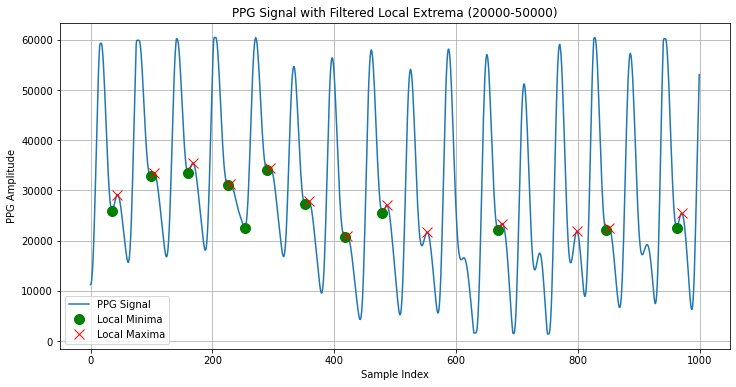

In [40]:

# Read CSV data and select signal column (adjust if necessary)
df = pd.read_csv(csv_file)['ShiftedSignal'].values[17000:18000]
# df = pd.read_csv(csv_file)['ShiftedSignal']


# Generate time stamps based on the index (assuming a constant sampling rate)
time_stamps = np.arange(0,1000)  # Assuming the sampling rate is 1 sample per unit time

# Define value range for minima and maxima
min_threshold = 20000
max_threshold = 50000

# Peak detection for local minima and maxima
peaks_min, _ = find_peaks(-df, prominence=5)  # Inverted signal for minima
peaks_max, _ = find_peaks(df, prominence=5)

# Filter local minima and maxima within the value range
filtered_minima = [peak for peak in peaks_min if min_threshold < df[peak] < max_threshold]
filtered_maxima = [peak for peak in peaks_max if min_threshold < df[peak] < max_threshold]

# Create the combined plot
plt.figure(figsize=(12, 6))  # Adjust figure size as needed

# Plot the PPG signal
plt.plot(df, label='PPG Signal')

# Plot filtered local minima (green) and maxima (red)
plt.plot(filtered_minima, df[filtered_minima], "o", markersize=10, markerfacecolor='green', markeredgecolor='green', label='Local Minima')
plt.plot(filtered_maxima, df[filtered_maxima], "x", markersize=10, markerfacecolor='red', markeredgecolor='red', label='Local Maxima')

# Print filtered local minima and maxima values and corresponding time stamps (assuming time_stamps has aligned indices)
print("Filtered Local Minima:")
for peak in filtered_minima:
#     print(f"- Value: {df[peak]}, Time: {time_stamps[peak]} ms")
    print(f"{df[peak]}")
    

print("Filtered Local Maxima:")
for peak in filtered_maxima:
#     print(f"- Value:{df[peak]}, Time: {time_stamps[peak]} ms")
    print(f"{df[peak]}")
    

# Customize plot appearance
plt.xlabel('Sample Index')  # Adjust label as needed
plt.ylabel('PPG Amplitude')  # Adjust label as needed
plt.title('PPG Signal with Filtered Local Extrema (20000-50000)')
plt.legend()
plt.grid(True)
plt.show()


In [14]:

# Replace 'path/to/your/data.csv' with your actual file path
csv_path = 'imrul_10_100_with_shifted_signal.csv'
time_stamps = df['Time'].to_numpy()
# Read CSV data and select signal column (adjust if necessary)
data = pd.read_csv(csv_path)['ShiftedSignal'].to_numpy()

# Ensure data is 1-dimensional
data = data.flatten()
# Take only the first 1000 data points
data = data[000:3000]

# Peak detection for local maxima
peaks_max, _ = find_peaks(data, prominence=10)

# Peak detection for local minima
peaks_min, _ = find_peaks(-data, prominence=10)

# Plot PPG signal with peaks
plt.figure(figsize=(10, 6))
plt.plot(data, label='PPG Signal')
plt.plot(peaks_max, data[peaks_max], "x", markersize=10, label='Local Maxima', color='red')
plt.plot(peaks_min, data[peaks_min], "x", markersize=10, label='Local Minima', color='green')
plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Local Extrema (First 1000 Data Points)')
plt.legend()
plt.grid(True)
plt.show()
# Find global minima of the negated PPG signal
minima, _ = find_peaks(-data, prominence=10)

# Filter minima based on condition (minimum value > 22000)
filtered_minima = [min_index for min_index in minima if data[min_index] < 21000]

# Plot PPG signal
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.plot(data,)
plt.title('PPG Signal with Filtered Global Minima')
plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')

plt.plot(filtered_minima, data[filtered_minima], 'ro', markersize=6, label='Filtered Global Minima')

# Draw full vertical lines at filtered global minima positions
for min_index in filtered_minima:
    plt.axvline(x=min_index, color='red', linestyle='-', alpha=0.5)

plt.legend()
plt.show()

# Extract time stamps corresponding to filtered global minima
time_of_minima = time_stamps[filtered_minima]

# Print time stamps
for idx, time in enumerate(time_of_minima):
    print(f"Time of cycle end {idx+1}: {time} ms")

# Extract time stamps corresponding to filtered global minima
time_of_minima = time_stamps[filtered_minima]

# Calculate cycle times
cycle_times = []
for i in range(1, len(time_of_minima)):
    cycle_time = time_of_minima[i] - time_of_minima[i-1]
    cycle_times.append(cycle_time)

# Print cycle times
for idx, time in enumerate(cycle_times):
    print(f" {time}")

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

IndexError: index 1031 is out of bounds for axis 0 with size 1000

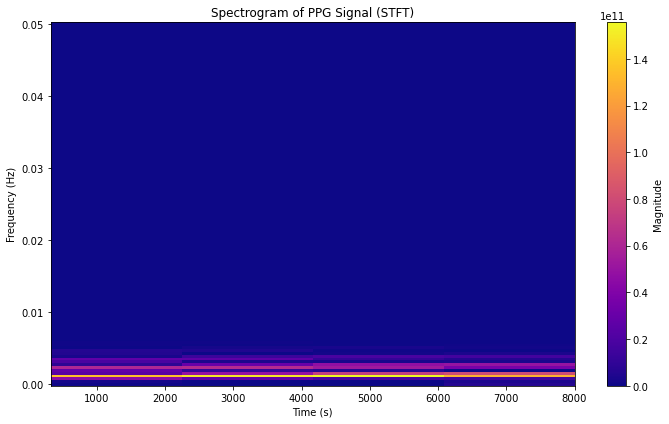

In [14]:
import numpy as np
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt

# Read PPG data from CSV
data = pd.read_csv('imrul_10_100_with_shifted_signal.csv')


ppg_amplitude = data['ShiftedSignal'][:1000]  # Take only the first 100 samples

# Define window size (adjust as needed)
window_size = 256

# Ensure noverlap is less than window_size
overlap = window_size // 4  # Adjust overlap (less than window_size)

# Apply STFT using Hann window
f, t, Zxx = signal.spectrogram(ppg_amplitude, fs=1/np.mean(np.diff(time[:100])), window='hann', nperseg=window_size, noverlap=overlap)

# Reduce time samples to match spectrogram (optional)
t = t[:len(Zxx[0])]

# Plot spectrogram (heatmap)
plt.figure(figsize=(10, 6))
plt.pcolormesh(t, f, np.abs(Zxx), cmap='plasma')  # Adjust colorscale as desired
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.title('Spectrogram of PPG Signal (STFT)')
plt.colorbar(label='Magnitude')
plt.tight_layout()
plt.show()



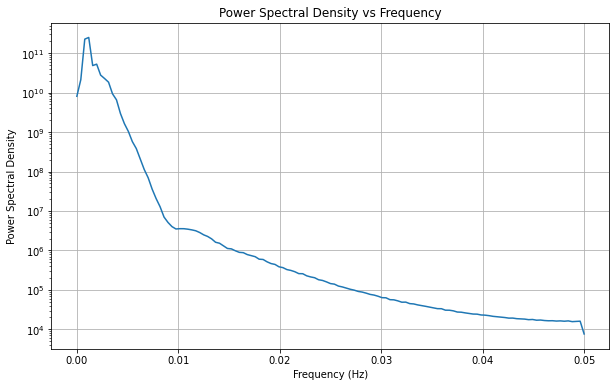

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Load the CSV file containing PPG signal data
file_path = "prince_10_100_with_shifted_signal.csv"
ppg_data = pd.read_csv(file_path)

# Assuming the CSV file has two columns: Time and PPG Signal
time = ppg_data['Time']  # Time data
ppg_signal = ppg_data['ShiftedSignal']  # PPG signal data

# Compute the Power Spectral Density (PSD) using Welch's method
fs = 1 / (time[1] - time[0])  # Sampling frequency
frequencies, psd = welch(ppg_signal, fs=fs)

# Plot the Power Spectral Density (PSD) against frequency
plt.figure(figsize=(10, 6))
plt.semilogy(frequencies, psd)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density')
plt.title('Power Spectral Density vs Frequency')
plt.grid(True)
plt.show()


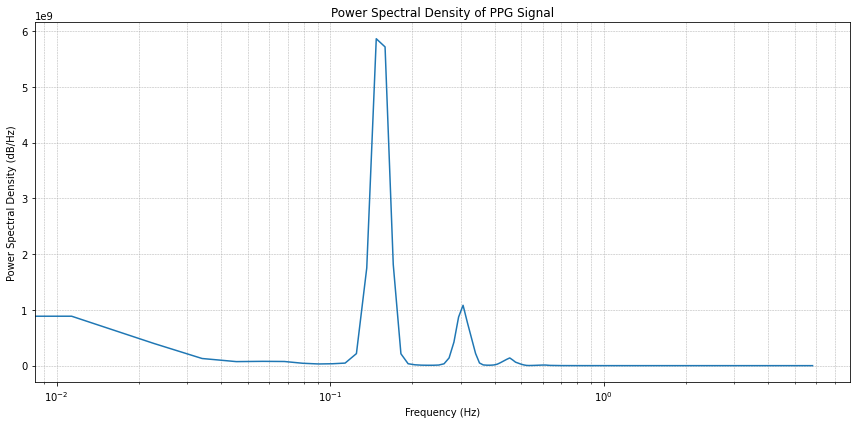

In [125]:
# import pandas as pd
# from scipy import signal
# import matplotlib.pyplot as plt

# # Read PPG data from CSV
data = pd.read_csv('asad_70_500_with_shifted_signal.csv')
ppg_amplitude = data['ShiftedSignal']

# Calculate PSD using Welch's method
# file_path = "tasmir_10_100_with_shifted_signal.csv"
f, Pxx = signal.welch(ppg_amplitude, fs=1/np.mean(np.diff(data['Time'])), nperseg=1024)  # Adjust window size

# Plot PSD
plt.figure(figsize=(12, 6))
plt.plot(f, Pxx)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (dB/Hz)')  # Adjust units if needed
plt.title('Power Spectral Density of PPG Signal')
plt.semilogx()  # Logarithmic x-axis for better visualization
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


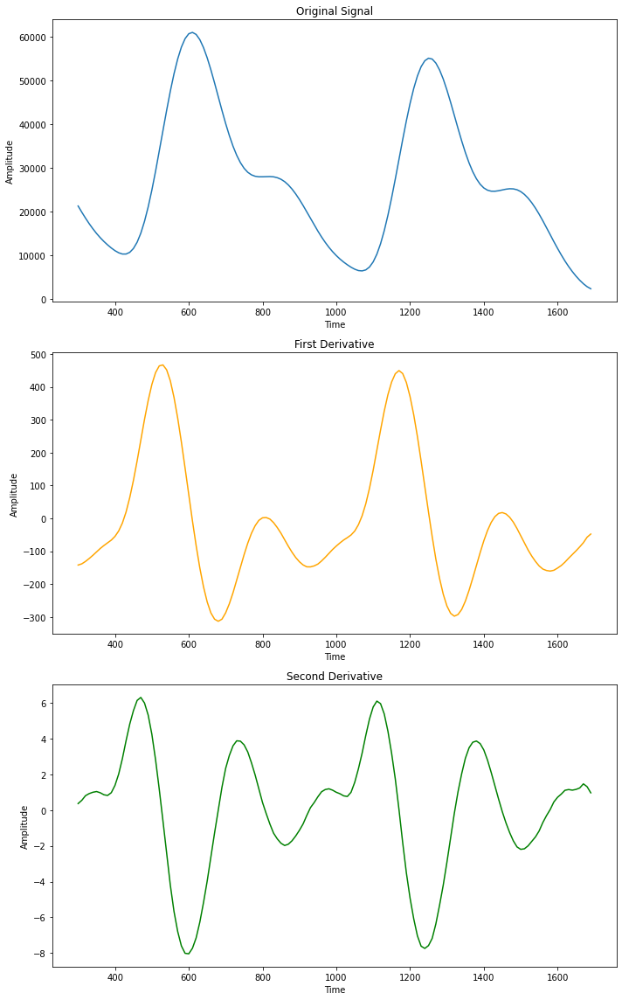

In [116]:
 # # Read PPG data from CSV
data = pd.read_csv('tasmir_70_500_with_shifted_signal.csv')
# ppg_amplitude = data['ShiftedSignal'][:50000]

    # PPG signal data
time = data['Time'][30: 170]  # Time data, taking first 1000 samples
ppg_signal = data['ShiftedSignal'][30:170]
# Compute the first derivative using numpy's gradient function
first_derivative = np.gradient(ppg_signal, time)

# Compute the second derivative using numpy's gradient function on the first derivative
second_derivative = np.gradient(first_derivative, time)

# Plot the original signal, first derivative, and second derivative
plt.figure(figsize=(10, 16))

plt.subplot(3, 1, 1)
plt.plot(time, ppg_signal, label='Original Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Original Signal')

plt.subplot(3, 1, 2)
plt.plot(time, first_derivative, label='First Derivative', color='orange')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('First Derivative')

plt.subplot(3, 1, 3)
plt.plot(time, second_derivative, label='Second Derivative', color='green')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Second Derivative')

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Original Signal')

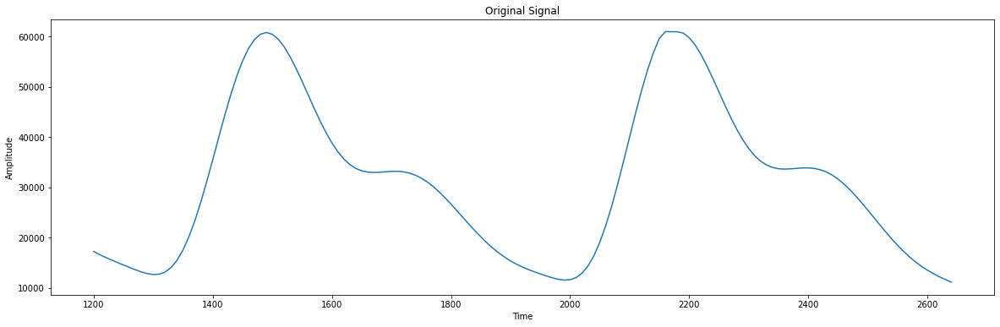

In [97]:
a = 41120
b = 41265
time = data['Time'][a:b]  # Time data, taking first 1000 samples
ppg_signal = data['ShiftedSignal'][a:b]
# Plot the original signal, first derivative, and second derivative
plt.figure(figsize=(20, 6))


plt.plot(time, ppg_signal, label='Original Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Original Signal')


In [123]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Read PPG data from CSV
data = pd.read_csv('tasmir_70_500_with_shifted_signal.csv')

# PPG signal data
time = data['Time'][41265: 41600]  # Time data, taking first 1000 samples
ppg_signal = data['ShiftedSignal'][32265:32600]

# Compute the first derivative using numpy's gradient function
first_derivative = np.gradient(ppg_signal, time)

# Compute the second derivative using numpy's gradient function on the first derivative
second_derivative = np.gradient(first_derivative, time)

# Normalize first and second derivatives
first_derivative /= np.max(np.abs(first_derivative))
second_derivative /= np.max(np.abs(second_derivative))
fig = go.Figure()
fig.add_trace(go.Scatter(x=time, y=ppg_signal, mode='lines', name='Original Signal'))
# Update layout
fig.update_layout(title='PPG Signal and Its Derivatives',
                  xaxis_title='Time',
                  yaxis_title='Normalized Amplitude')

# Show plot
fig.show()
# Create Plotly figure
fig = go.Figure()

# Add traces for original signal, first derivative, and second derivative
# fig.add_trace(go.Scatter(x=time, y=ppg_signal, mode='lines', name='Original Signal'))
fig.add_trace(go.Scatter(x=time, y=first_derivative, mode='lines', name='First Derivative', line=dict(color='orange')))
fig.add_trace(go.Scatter(x=time, y=second_derivative, mode='lines', name='Second Derivative', line=dict(color='green')))

# Update layout
fig.update_layout(title='PPG Signal and Its Derivatives',
                  xaxis_title='Time',
                  yaxis_title='Normalized Amplitude')

# Show plot
fig.show()


Peak Frequency: 0.41369357638888893 Hz
Peak PSD: 1810971167.8516774 dB/Hz


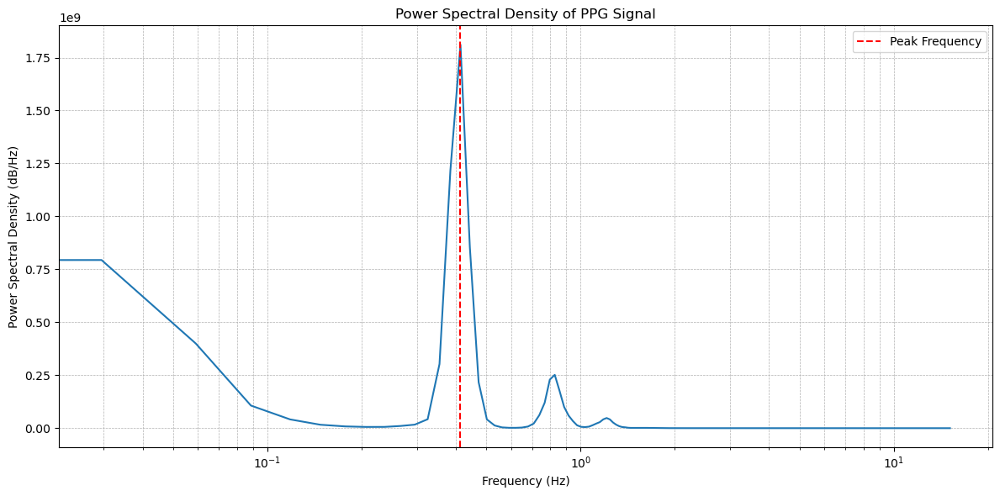

In [2]:
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np

# Read PPG data from CSV
data = pd.read_csv('tasmir_70_500_with_shifted_signal.csv')
ppg_amplitude = data['ShiftedSignal']

# Calculate PSD using Welch's method
f, Pxx = signal.welch(ppg_amplitude, fs=1/np.mean(np.diff(data['Time'])), nperseg=1024)  # Adjust window size

# Find the peak frequency and its corresponding PSD value
peak_idx = np.argmax(Pxx)  # Index of the maximum value in Pxx
peak_freq = f[peak_idx]
peak_psd = Pxx[peak_idx]

# Print the peak information
print("Peak Frequency:", peak_freq, "Hz")
print("Peak PSD:", peak_psd, "dB/Hz")  # Adjust units if needed

# Plot PSD (optional)
plt.figure(figsize=(12, 6))
plt.plot(f, Pxx)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (dB/Hz)')  # Adjust units if needed
plt.title('Power Spectral Density of PPG Signal')
plt.semilogx()  # Logarithmic x-axis for better visualization
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.axvline(x=peak_freq, color='r', linestyle='--', label='Peak Frequency')  # Mark the peak
plt.legend()
plt.tight_layout()
plt.show()


In [7]:
import pandas as pd
from scipy import signal
import plotly.graph_objects as go

# Read PPG data from CSV
data = pd.read_csv('tasmir_70_500_with_shifted_signal.csv')
ppg_amplitude = data['ShiftedSignal'][10000:]

# Calculate PSD using Welch's method
f, Pxx = signal.welch(ppg_amplitude, fs=1/np.mean(np.diff(data['Time'])), nperseg=1024)  # Adjust window size

# Find the peak frequency and its corresponding PSD value
peak_idx = np.argmax(Pxx)
peak_freq = f[peak_idx]
peak_psd = Pxx[peak_idx]

# Create Plotly trace for PSD
trace_psd = go.Scatter(
    x=f,
    y=Pxx,
    mode='lines',
    name='Power Spectral Density (PSD)',
    line=dict(color='blue', width=2)
)

# Create Plotly trace for peak line (optional)
trace_peak = go.Scatter(
    x=[peak_freq, peak_freq],  # Vertical line at peak frequency
    y=[0, peak_psd],  # Line starts from 0 (adjust if needed)
    mode='lines',
    name='Peak Frequency',
    line=dict(color='red', width=1, dash='dash')  # Dashed red line
)

# Configure layout
layout = go.Layout(
    title='Power Spectral Density of PPG Signal',
    xaxis_title='Frequency (Hz)',
    yaxis_title='Power Spectral Density (dB/Hz)',  # Adjust units if needed
    xaxis_type='log',  # Logarithmic x-axis for better visualization
    legend_title='Traces',
)

# Create figure with traces and layout
fig = go.Figure(data=[trace_psd], layout=layout)  # Add peak trace if desired: fig = go.Figure(data=[trace_psd, trace_peak], layout=layout)

fig.show()


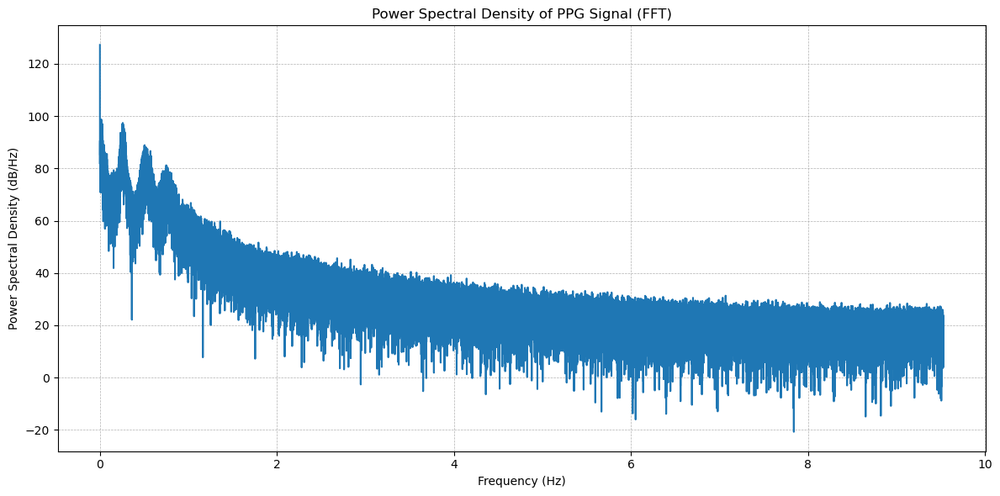

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read PPG data from CSV
data = pd.read_csv('tasmir_70_500_with_shifted_signal.csv')
ppg_signal = data['ShiftedSignal']  # Take the first 1000 samples

# Sampling frequency (assuming uniform sampling)
fs = 1 / np.mean(np.diff(data['Time']))

# Calculate FFT
fft_result = np.fft.fft(ppg_signal)
freq = np.fft.fftfreq(len(ppg_signal), d=1/fs)

# Calculate PSD
psd = np.abs(fft_result) ** 2 / (len(ppg_signal) * fs)

# Plot PSD
plt.figure(figsize=(12, 6))
plt.plot(freq[:len(freq)//2], 10 * np.log10(psd[:len(freq)//2]))  # Plot only positive frequencies
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power Spectral Density (dB/Hz)')
plt.title('Power Spectral Density of PPG Signal (FFT)')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
# plt.semilogx()  # Logarithmic x-axis for better visualization
plt.tight_layout()
plt.show()